In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

## INTRODUCTION
##### This dataset provides a rich set of data points related to video game sales spanning various years, platforms, and regions. It captures a snapshot of the gaming industry, focusing on sales performance, regional market trends, and genre popularity. This type of dataset is invaluable for understanding historical sales dynamics, the influence of different gaming consoles, and the success metrics of major game publishers.
##### The Primary gaol of this dataset is suitable for analyzing global and regional sales trends, genre and platform popularity, and the influence of publishers over time.

In [2]:
df=pd.read_csv(r"C:\Users\hp\Downloads\vgsales.csv\vgsales.csv")
print(df.to_string())

        Rank                                                                                                                                  Name Platform    Year         Genre                               Publisher  NA_Sales  EU_Sales  JP_Sales  Other_Sales  Global_Sales
0          1                                                                                                                            Wii Sports      Wii  2006.0        Sports                                Nintendo     41.49     29.02      3.77         8.46         82.74
1          2                                                                                                                     Super Mario Bros.      NES  1985.0      Platform                                Nintendo     29.08      3.58      6.81         0.77         40.24
2          3                                                                                                                        Mario Kart Wii      Wii  2008.0        Raci

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Rank          16598 non-null  int64  
 1   Name          16598 non-null  object 
 2   Platform      16598 non-null  object 
 3   Year          16327 non-null  float64
 4   Genre         16598 non-null  object 
 5   Publisher     16540 non-null  object 
 6   NA_Sales      16598 non-null  float64
 7   EU_Sales      16598 non-null  float64
 8   JP_Sales      16598 non-null  float64
 9   Other_Sales   16598 non-null  float64
 10  Global_Sales  16598 non-null  float64
dtypes: float64(6), int64(1), object(4)
memory usage: 1.4+ MB


In [4]:
df.isnull().sum()

Rank              0
Name              0
Platform          0
Year            271
Genre             0
Publisher        58
NA_Sales          0
EU_Sales          0
JP_Sales          0
Other_Sales       0
Global_Sales      0
dtype: int64

In [5]:
df.dropna(inplace=True)

In [6]:
df.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
16593    False
16594    False
16595    False
16596    False
16597    False
Length: 16291, dtype: bool

In [7]:
df.describe()

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
count,16291.000000,16291.000000,16291.000000,16291.000000,16291.000000,16291.000000,16291.000000
mean,8290.190228,2006.405561,0.265647,0.147731,0.078833,0.048426,0.540910
std,4792.654450,5.832412,0.822432,0.509303,0.311879,0.190083,1.567345
min,1.000000,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000
25%,4132.500000,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000
50%,8292.000000,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000
75%,12439.500000,2010.000000,0.240000,0.110000,0.040000,0.040000,0.480000
max,16600.000000,2020.000000,41.490000,29.020000,10.220000,10.570000,82.740000


In [8]:
df.to_csv('cleaned_df.csv')

In [9]:
data=pd.read_csv('cleaned_df.csv')
print(data.to_string())

       Unnamed: 0   Rank                                                                                                                                  Name Platform    Year         Genre                               Publisher  NA_Sales  EU_Sales  JP_Sales  Other_Sales  Global_Sales
0               0      1                                                                                                                            Wii Sports      Wii  2006.0        Sports                                Nintendo     41.49     29.02      3.77         8.46         82.74
1               1      2                                                                                                                     Super Mario Bros.      NES  1985.0      Platform                                Nintendo     29.08      3.58      6.81         0.77         40.24
2               2      3                                                                                                                   

***1. What genre games have been made the most?***

In [10]:
print(data['Genre'].value_counts())
print('\nGenre games have been made the most : Action')

Genre
Action          3251
Sports          2304
Misc            1686
Role-Playing    1470
Shooter         1282
Adventure       1274
Racing          1225
Platform         875
Simulation       848
Fighting         836
Strategy         670
Puzzle           570
Name: count, dtype: int64

Genre games have been made the most : Action


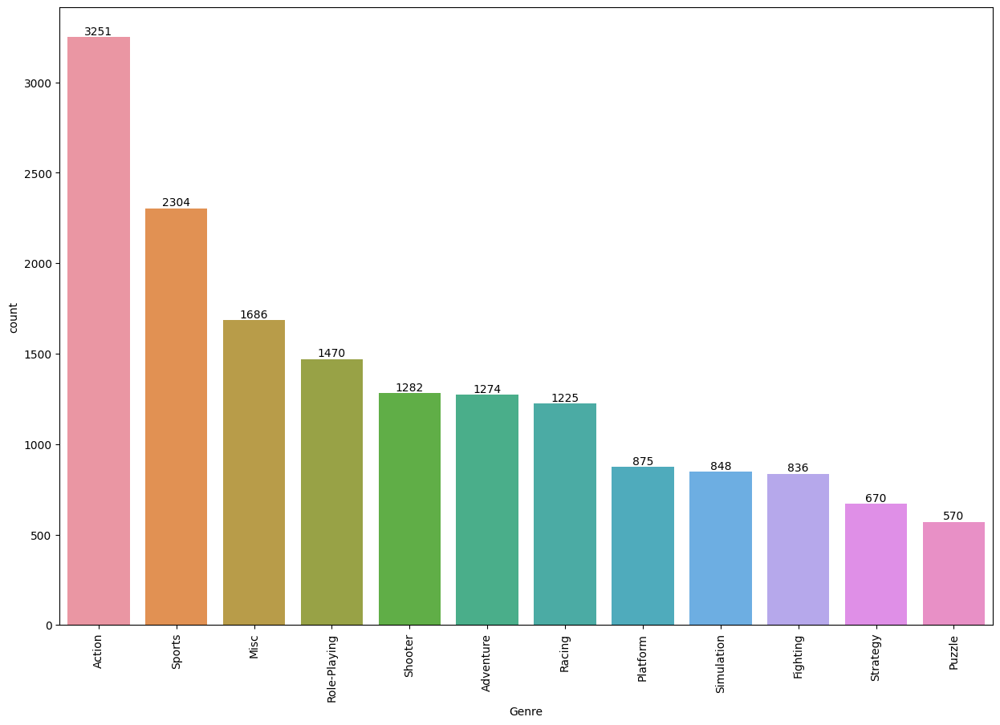

In [11]:
# Plot the data
plt.figure(figsize=(15, 10))
ax = sns.countplot(x="Genre", data=data, order = data['Genre'].value_counts().index)
plt.bar_label(ax.containers[0],fontsize=10)
plt.xticks(rotation=90)

# Displaying the plot
plt.show()

### REPORT :- ###
#### The most produced game genre is Action with 3,251 titles, followed by Sports (2,304) and Miscellaneous (1,686), while genres like Strategy (670) and Puzzle (570) see the least production. #####


***2. Which year had the most game release?***

In [12]:
most_games = data.groupby(by=['Year'])['Name'].count().sort_values(ascending=False)
print(most_games.head(10))

orders = most_games.index

Year
2009.0    1431
2008.0    1428
2010.0    1257
2007.0    1201
2011.0    1136
2006.0    1008
2005.0     936
2002.0     829
2003.0     775
2004.0     744
Name: Name, dtype: int64


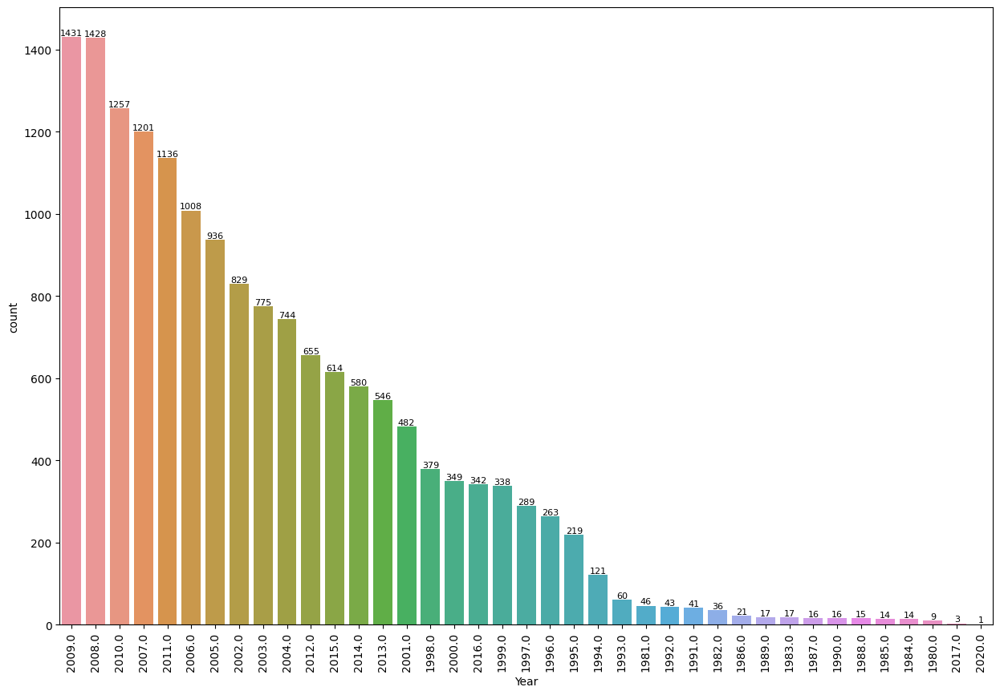

In [13]:
#  Plot the data
plt.figure(figsize=(15, 10))
ax = sns.countplot(x="Year", data=data, order = orders)
plt.bar_label(ax.containers[0],fontsize=8)
plt.xticks(rotation=90)

# Displaying the plot
plt.show()

### REPORT :- ###
##### The analysis of game production by year shows that the most games were released in 2009 (1,431 titles), followed closely by 2008 (1,428 titles) and 2010 (1,257 titles). The production decreased in the following years, with 2007 (1,201 titles) and 2011 (1,136 titles) still showing significant numbers, while the early 2000s saw fewer releases, with 2002 (829 titles) being the lowest in this sample.

***3. Top 5 years games release by genre?***

In [14]:
ditto = data.Year.value_counts().iloc[:5] 
print(ditto)

dittos = ditto.index

Year
2009.0    1431
2008.0    1428
2010.0    1257
2007.0    1201
2011.0    1136
Name: count, dtype: int64


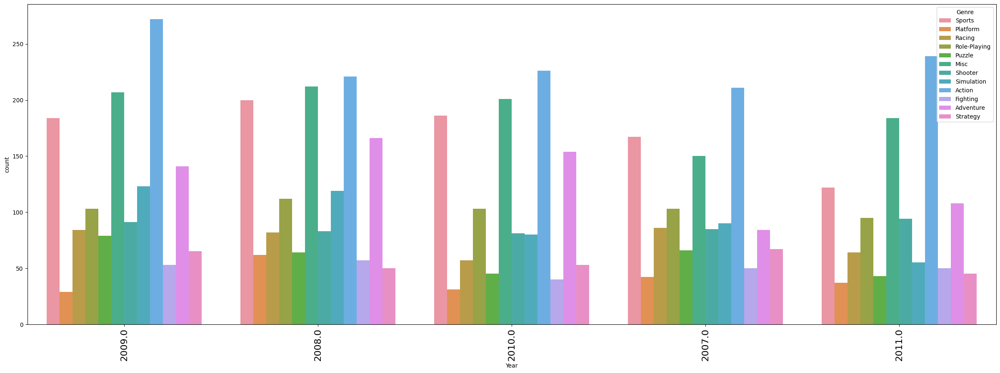

In [15]:
# Set up the plot
plt.figure(figsize=(30, 10))
sns.countplot(x="Year", data=data, hue='Genre', order=dittos)
plt.xticks(size=16, rotation=90)

# Displaying the plot
plt.show()

### REPORT :- ###
##### The highest game production occurred in 2008 and 2009, with nearly identical numbers, indicating a peak period for the gaming industry. These years likely saw a significant rise in game development, possibly due to advancements in technology, the rise of new gaming platforms, or increased consumer demand. The production volume remained strong in 2010 and 2007, although there was a slight decline in 2011, suggesting a possible shift in the gaming industry's focus or market saturation during that time.#####

***4. Which year had the highest sales worldwide?***

In [16]:
data_year = data.groupby(by=['Year'])['Global_Sales'].sum()
data_year = data_year.reset_index()
data_year
# data_year.sort_values(by=['Global_Sales'], ascending=False)


,Year,Global_Sales
0,1980.0,11.38
1,1981.0,35.77
2,1982.0,28.86
3,1983.0,16.79
4,1984.0,50.36
5,1985.0,53.94
6,1986.0,37.07
7,1987.0,21.74
8,1988.0,47.22
9,1989.0,73.45


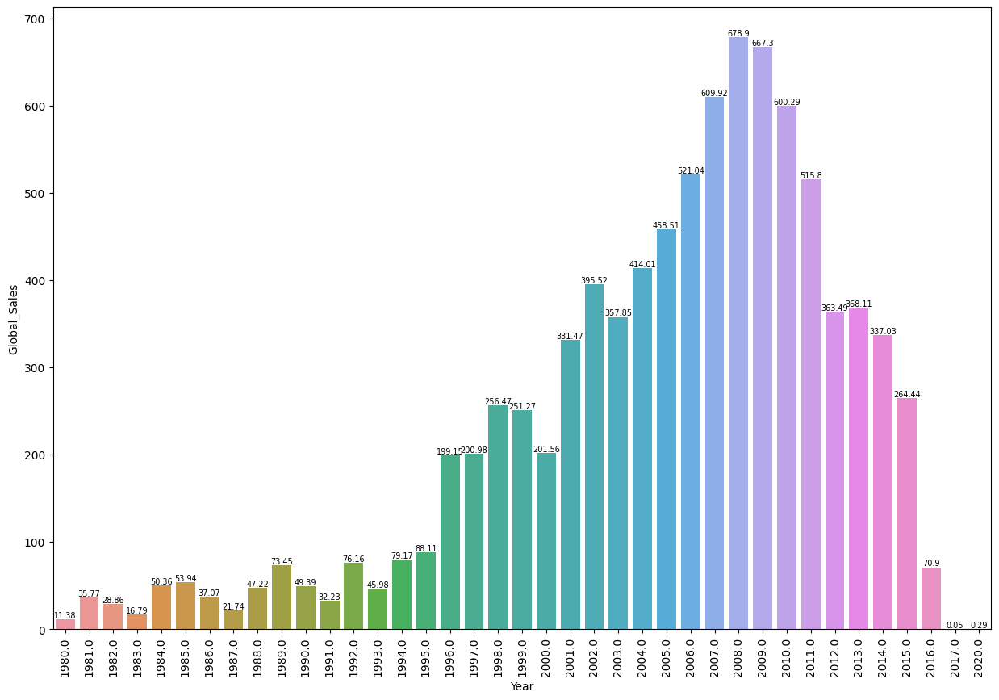

In [17]:
plt.figure(figsize=(15, 10))
ax = sns.barplot(x="Year", y="Global_Sales", data=data_year)

# Title and labels
plt.bar_label(ax.containers[0],fontsize=7)
plt.xticks(rotation=90)

# Displaying the plot
plt.show()

### REPORT :-
##### The year 2008 recorded the highest global sales, reaching 678.90 million units, which suggests it was a peak year for the gaming industry. This could be attributed to the release of popular titles and the growth of gaming consoles like the PlayStation 3 and Xbox 360. The sales started to decline after 2008, with 2009 and 2010 still showing strong sales but at lower levels, likely due to market saturation and the economic downturn during that period.

***5. Which genre game has been released the most in a single year?***

In [18]:
genre_count_all_years = data.groupby(['Year', 'Genre']).size().reset_index(name='Count')
genre_count_all_years.sort_values(by='Count',ascending=False).head(5)


,Year,Genre,Count
291,2009.0,Action,272
327,2012.0,Action,265
363,2015.0,Action,255
315,2011.0,Action,239
303,2010.0,Action,226


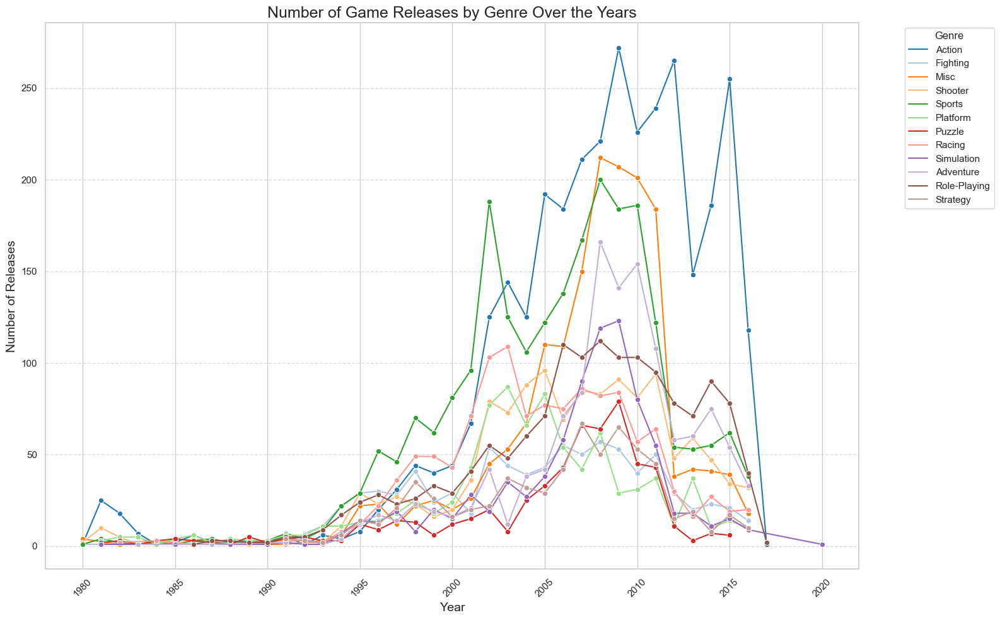

In [19]:
# Set up a larger plot for all years
plt.figure(figsize=(16, 10))
sns.set(style="whitegrid")

# Create a line plot with multiple lines, one for each genre
sns.lineplot(data=genre_count_all_years, x='Year', y='Count', hue='Genre', marker='o', palette="tab20", linewidth=1.5)

# Title and labels
plt.title('Number of Game Releases by Genre Over the Years', fontsize=18)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of Releases', fontsize=14)
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Displaying the plot
plt.show()

### REPORT :-
##### The Action genre saw its peak in 2009, with 272 games released, indicating a surge in demand for action-oriented gameplay during that period. This could be attributed to the popularity of action franchises and advancements in gaming hardware, which allowed for more dynamic and immersive experiences. Subsequent years, like 2012 and 2015, still saw a strong presence of action games, but with slightly fewer releases, reflecting a maturing market and the diversification of game genres.

***6. Which genre game has sold the most in a single year?***

In [20]:
# Group by 'Year' and 'Genre', summing up the 'Global_Sales' for each combination
genre_sales_per_year = data.groupby(['Year', 'Genre'])['Global_Sales'].sum().reset_index()

# Find the genre with the highest sales in a single year
max_genre_sales = genre_sales_per_year[genre_sales_per_year['Global_Sales'] == genre_sales_per_year['Global_Sales'].max()]
print(max_genre_sales)

print(f'\nThe genre game has sold the most in a single year is: Action')

       Year   Genre  Global_Sales
291  2009.0  Action        139.36

The genre game has sold the most in a single year is: Action


### REPORT :-
##### The Action genre had the highest global sales in 2009, with 139.36 million units sold worldwide. This indicates that 2009 was a peak year for action games, both in terms of the number of releases and the sales, likely driven by the popularity of major action titles and gaming platforms.

***7. Which genre game have the highest sale price globally?***

In [21]:
# Group the Data by Genre and calculate total global sales
data_genre = data.groupby(by=['Genre'])['Global_Sales'].sum()
data_genre = data_genre.reset_index()
data_genre = data_genre.sort_values(by=['Global_Sales'], ascending=False)
data_genre

,Genre,Global_Sales
0,Action,1722.84
10,Sports,1309.24
8,Shooter,1026.20
7,Role-Playing,923.83
4,Platform,829.13
3,Misc,789.87
6,Racing,726.76
2,Fighting,444.05
9,Simulation,389.98
5,Puzzle,242.21


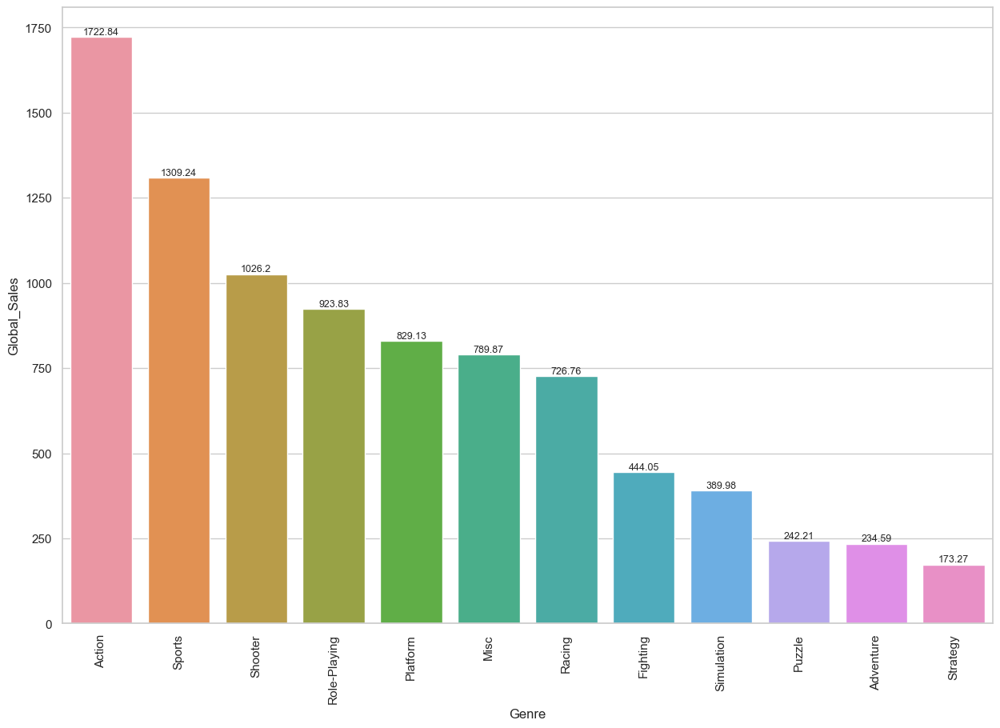

In [22]:
# Set the plot
plt.figure(figsize=(15, 10))
ax = sns.barplot(x="Genre", y="Global_Sales", data=data_genre)

# Titles and labels
plt.bar_label(ax.containers[0],fontsize=9)
plt.xticks(rotation=90)

# Displaying the plot
plt.show()

### REPORT :-
##### The Action genre leads global sales with a total of 1,722.84 million units, followed by Sports at 1,309.24 million units. Other top genres include Shooter (1,026.20 million) and Role-Playing (923.83 million). Genres with the lowest global sales include Strategy (173.27 million) and Adventure (234.59 million).

***8. Wat is Sales compearison by genre ?***


In [23]:
# Extracting Relevant Columns
comp_genre = data[['Genre', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']]
# print(comp_genre)

# Grouping by Genre and Summing Sales
comp_map = comp_genre.groupby(by=['Genre']).sum()
print(comp_map)


              NA_Sales  EU_Sales  JP_Sales  Other_Sales
Genre                                                  
Action          861.77    516.48    158.65       184.92
Adventure       101.93     63.74     51.99        16.70
Fighting        220.74    100.00     87.15        36.19
Misc            396.92    211.77    106.67        73.92
Platform        445.99    200.65    130.65        51.51
Puzzle          122.01     50.52     56.68        12.47
Racing          356.93    236.31     56.61        76.68
Role-Playing    326.50    187.57    350.29        59.38
Shooter         575.16    310.45     38.18       101.90
Simulation      181.78    113.02     63.54        31.36
Sports          670.09    371.34    134.76       132.65
Strategy         67.83     44.84     49.10        11.23


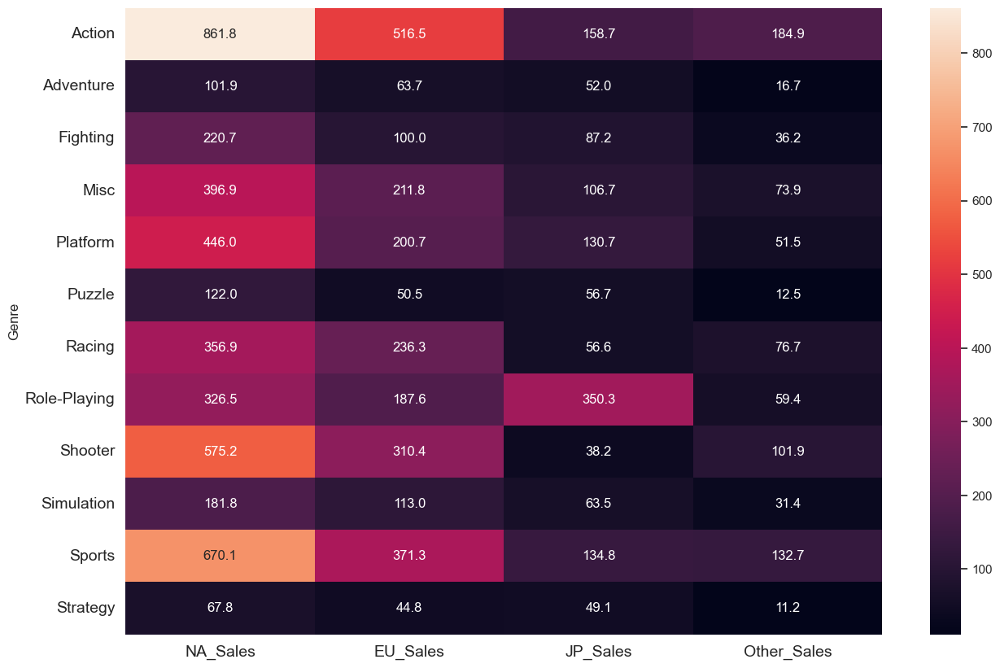

In [24]:
# Setting the plot
plt.figure(figsize=(15, 10))
sns.set(font_scale=1)
sns.heatmap(comp_map, annot=True, fmt = '.1f')

# Displaying the Heat Map
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

### REPORT :-
##### Action games have the highest sales in all regions, especially in North America. Sports games perform well in North America and Europe, with some sales in Japan. Role-Playing games are particularly popular in Japan. Puzzle and Strategy games have the lowest sales, especially in the "Other" category, indicating a smaller audience. Fighting and Shooter genres have steady global sales, with good performance in Europe and North America.

***9. Who are the Top 20 Publisher ?***

In [25]:
# Identifying and Displaying Top Publishers by Game Count
top_publisher = data.groupby(by=['Publisher'])['Year'].count().sort_values(ascending=False).head(20)
top_publisher = pd.DataFrame(top_publisher).reset_index()
top_publisher


,Publisher,Year
0,Electronic Arts,1339
1,Activision,966
2,Namco Bandai Games,928
3,Ubisoft,918
4,Konami Digital Entertainment,823
5,THQ,712
6,Nintendo,696
7,Sony Computer Entertainment,682
8,Sega,632
9,Take-Two Interactive,412


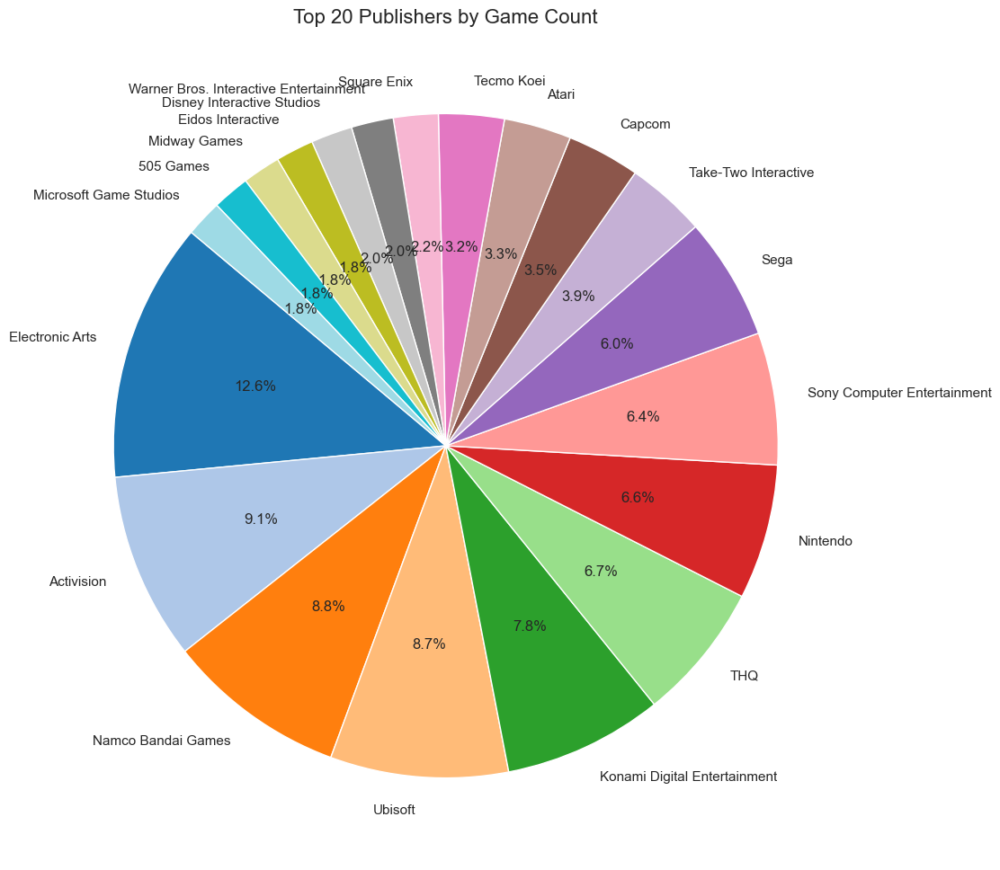

In [26]:
plt.figure(figsize=(12, 12))
plt.pie(
    top_publisher['Year'], 
    labels=top_publisher['Publisher'], 
    autopct='%1.1f%%', 
    startangle=140, 
    colors=plt.cm.tab20.colors
)
plt.title('Top 20 Publishers by Game Count', fontsize=16)
plt.show()

### REPORT :-
##### Electronic Arts leads with the most game releases (1,339), followed by Activision (966) and Namco Bandai Games (928), while publishers like Microsoft Game Studios and Eidos Interactive have fewer releases, indicating a more focused approach.

***10. What is the Total revenue by region ?***


In [27]:
# Extracting Regional Sales Data
top_sale_reg = data[['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']]

# Calculate Total Sales for Each Region
top_sale_reg = top_sale_reg.sum().reset_index()

#  Rename Columns for Clarity
top_sale_reg = top_sale_reg.rename(columns={"index": "region", 0: "sale"})
top_sale_reg

,region,sale
0,NA_Sales,4327.65
1,EU_Sales,2406.69
2,JP_Sales,1284.27
3,Other_Sales,788.91


In [28]:
labels = top_sale_reg['region']
sizes = top_sale_reg['sale']

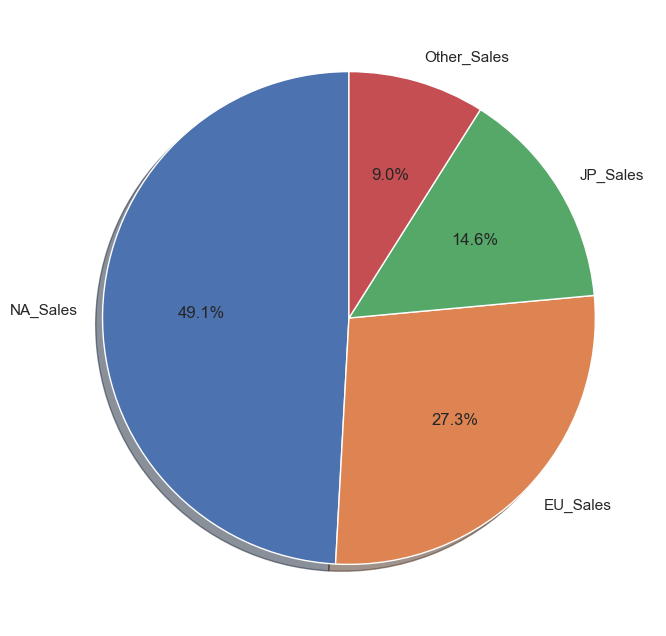

In [29]:
# Setting up the plot
plt.figure(figsize=(10, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)

# Displaying the plot
plt.show()

### REPORT :-
##### The highest game sales occurred in North America (NA_Sales), followed by Europe (EU_Sales). Japan (JP_Sales) shows significant sales, while Other regions account for the smallest portion of total sales.

## CONCLUSION
##### The dataset's diverse range of variables allows for multifaceted analyses, from comparing historical game performance across platforms to examining the market share of major publishers. Ultimately, this dataset serves as a valuable resource for uncovering patterns in the video game industry, providing data-driven insights that can influence future strategies, development plans, and academic discussions.

##### In conclusion, this dataset is not just a snapshot of video game sales; it’s a portal to understanding the broader trends and the pivotal shifts that have shaped the global gaming landscape.